1

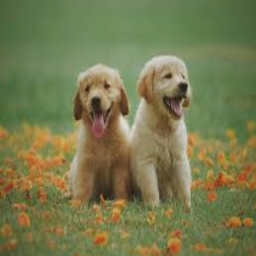

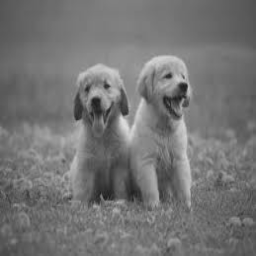

In [1]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
uploaded = cv2.imread('/content/img.jpeg')  # Upload using Colab's file upload tool
resized = cv2.resize(uploaded, (256, 256))
gray = cv2.cvtColor(resized, cv2.COLOR_BGR2GRAY)

cv2_imshow(resized)
cv2_imshow(gray)


2

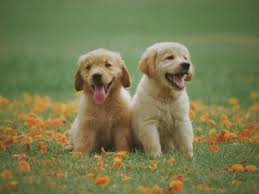

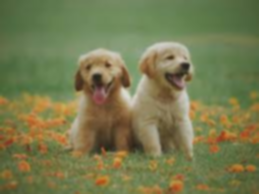

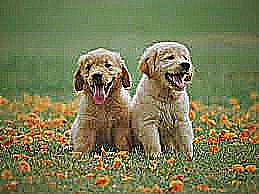

In [2]:
img = cv2.imread('/content/img.jpeg')
blurred = cv2.GaussianBlur(img, (5, 5), 0)

sharpen_kernel = np.array([[-1,-1,-1], [-1, 9,-1], [-1,-1,-1]])
sharpened = cv2.filter2D(img, -1, sharpen_kernel)

cv2_imshow(img)
cv2_imshow(blurred)
cv2_imshow(sharpened)


3

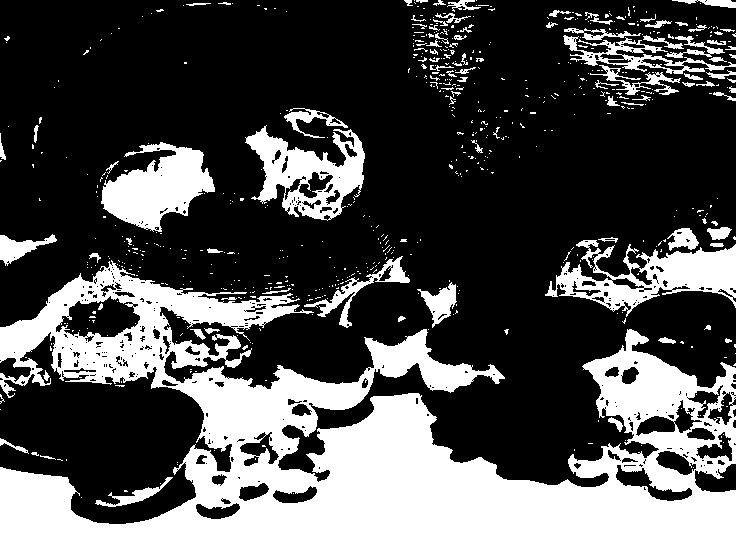

In [3]:
img = cv2.imread('/content/fruits.jpg')
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
lower_red = np.array([0,120,70])
upper_red = np.array([10,255,255])
mask = cv2.inRange(hsv, lower_red, upper_red)

cv2_imshow(mask)


4

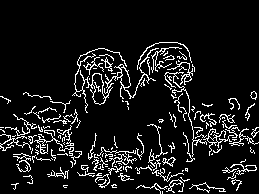

In [4]:
img = cv2.imread('/content/img.jpeg')
edges = cv2.Canny(img, 100, 200)

cv2_imshow(edges)


5

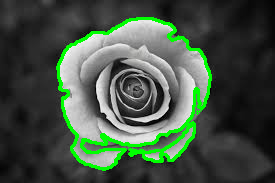

In [10]:
img = cv2.imread('/content/bandw.jpeg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(img, contours, -1, (0, 255, 0), 2)

cv2_imshow(img)



6

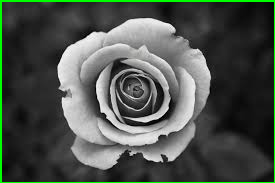

In [15]:
img = cv2.imread('/content/bandw.jpeg')
template = cv2.imread('/content/bandw.jpeg')

result = cv2.matchTemplate(img, template, cv2.TM_CCOEFF_NORMED)
_, _, _, max_loc = cv2.minMaxLoc(result)

h, w = template.shape[:2]
cv2.rectangle(img, max_loc, (max_loc[0]+w, max_loc[1]+h), (0, 255, 0), 2)

cv2_imshow(img)


7

Saving vidd.mp4 to vidd (1).mp4


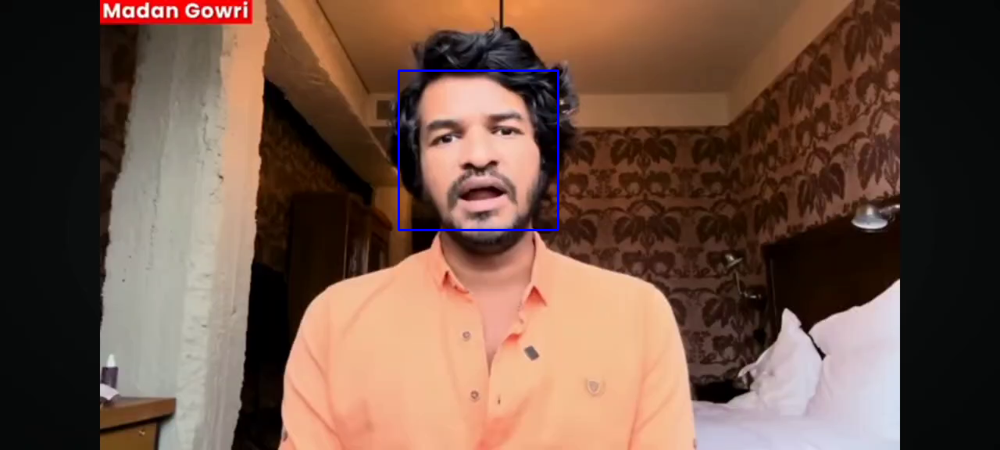

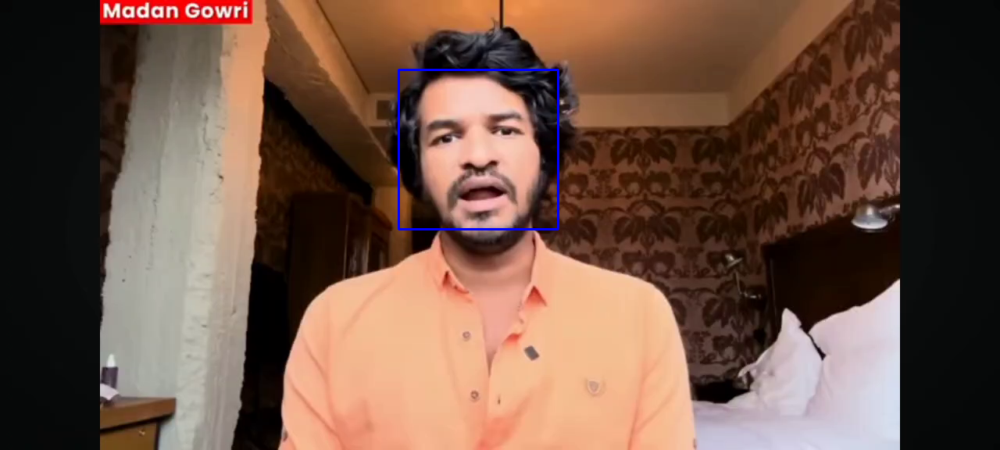

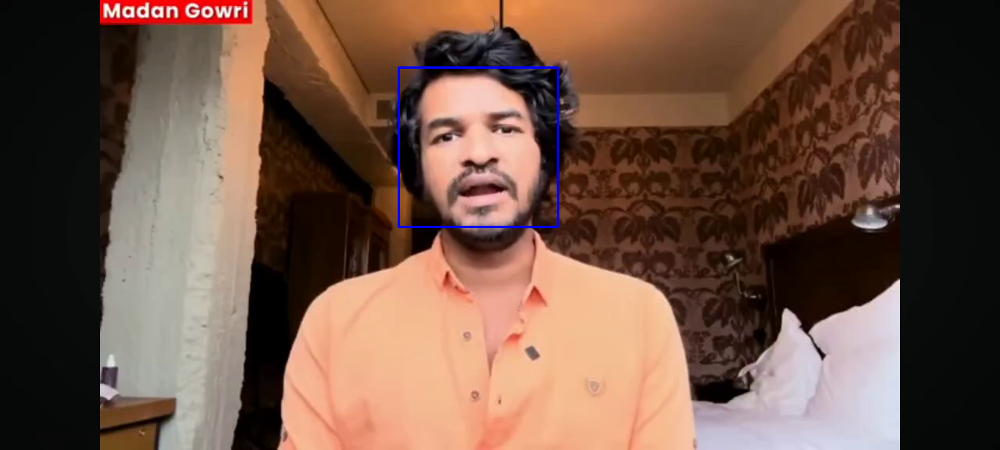

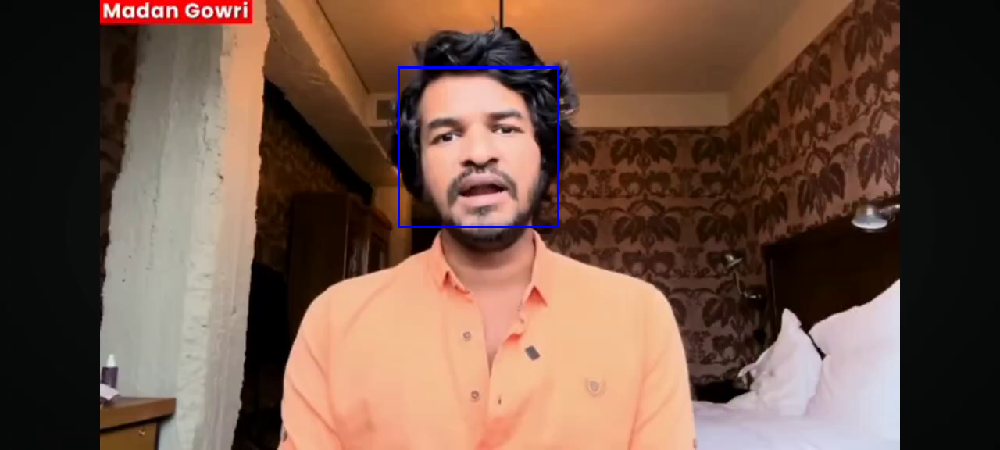

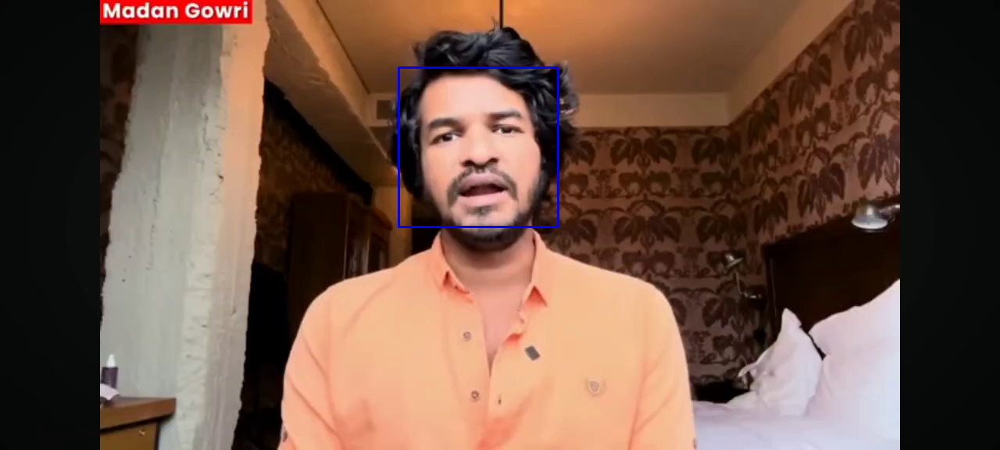

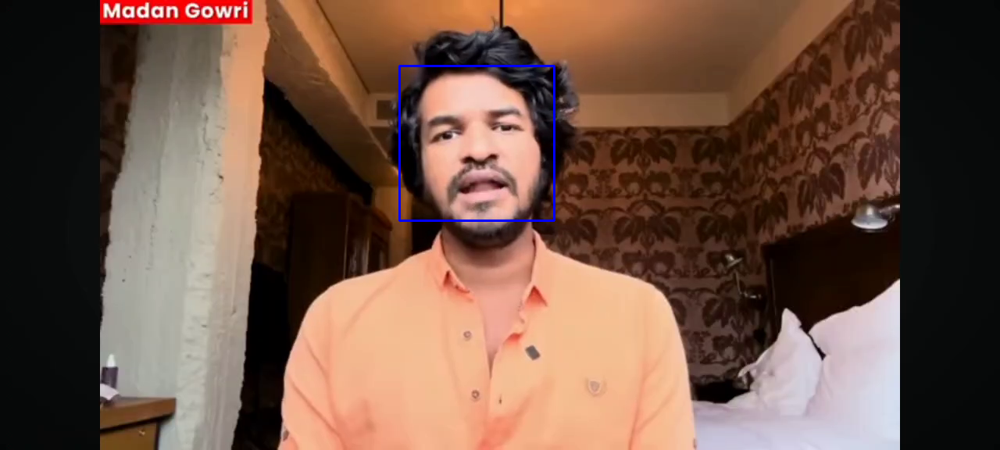

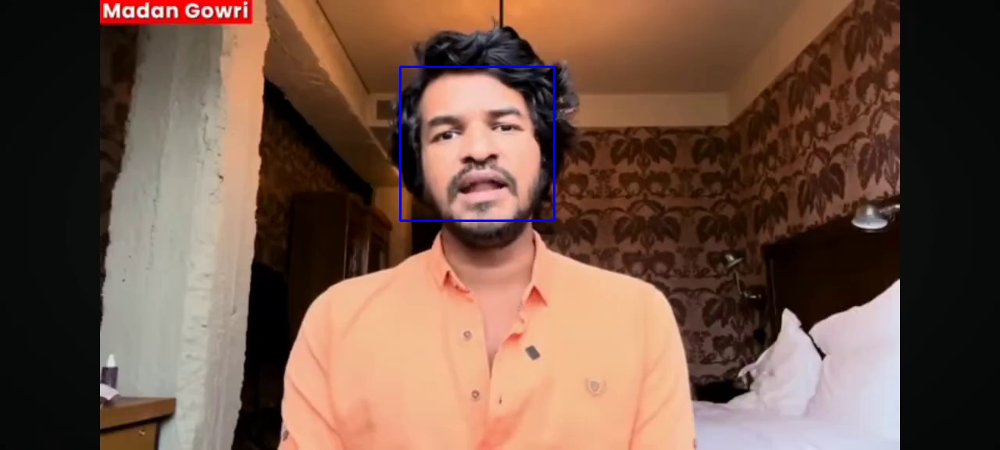

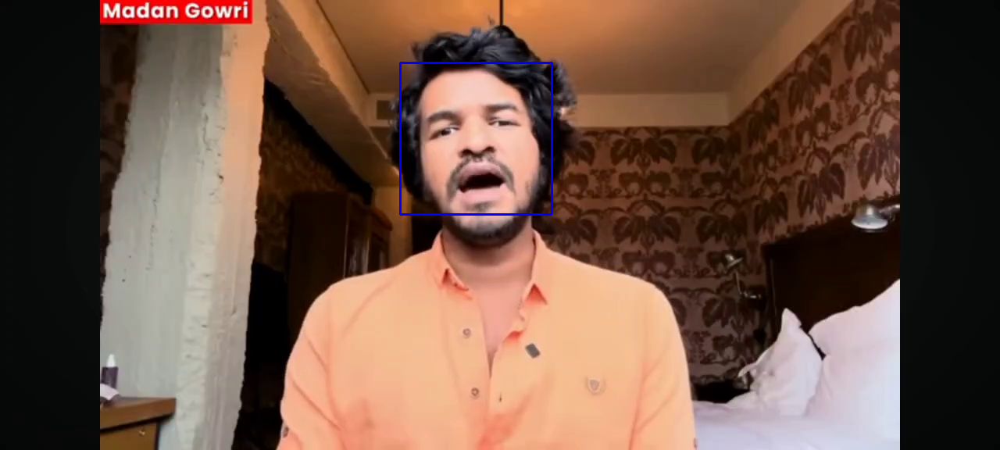

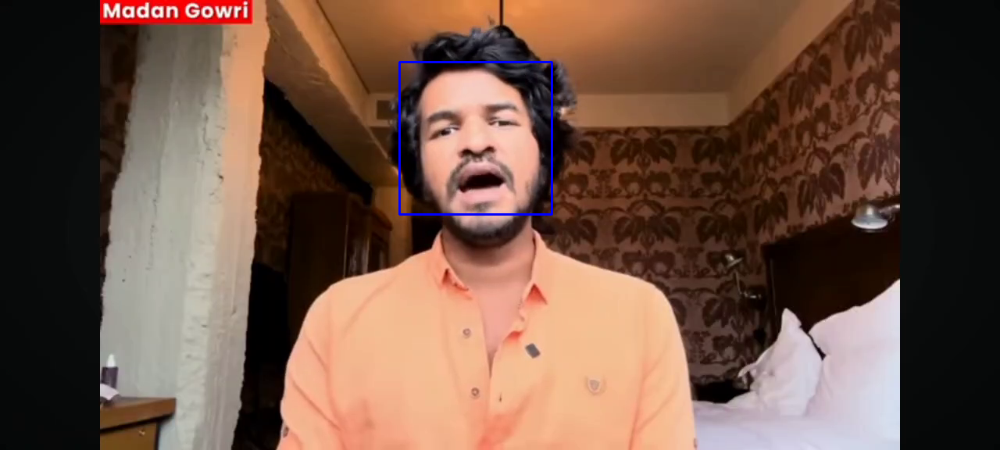

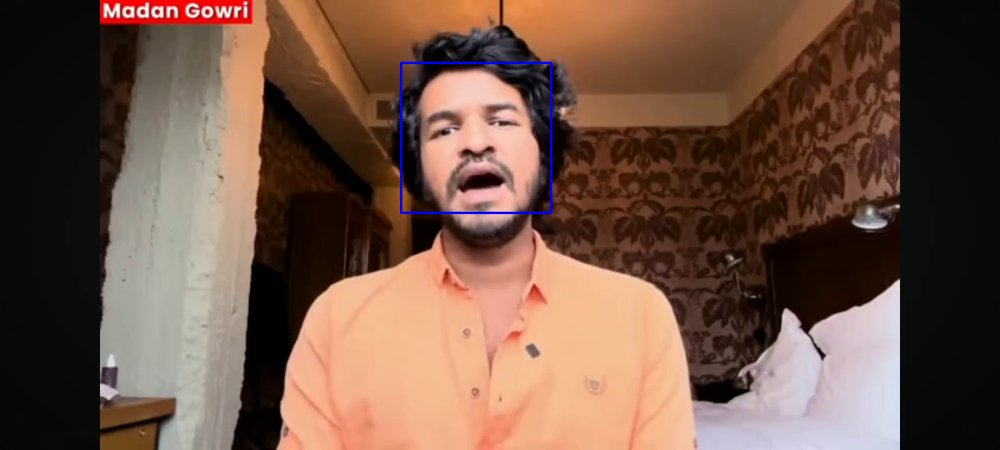

In [2]:
from google.colab import files
files.upload()  # Upload your video here

import cv2
from google.colab.patches import cv2_imshow

# Load face detector
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Load uploaded video (e.g., faces.mp4)
cap = cv2.VideoCapture('/content/vidd.mp4')  # Change to your uploaded video name

for _ in range(10):  # Show 10 frames
    ret, frame = cap.read()
    if not ret:
        break
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.1, 4)
    for (x, y, w, h) in faces:
        cv2.rectangle(frame, (x,y), (x+w,y+h), (255,0,0), 2)
    cv2_imshow(frame)

cap.release()

8

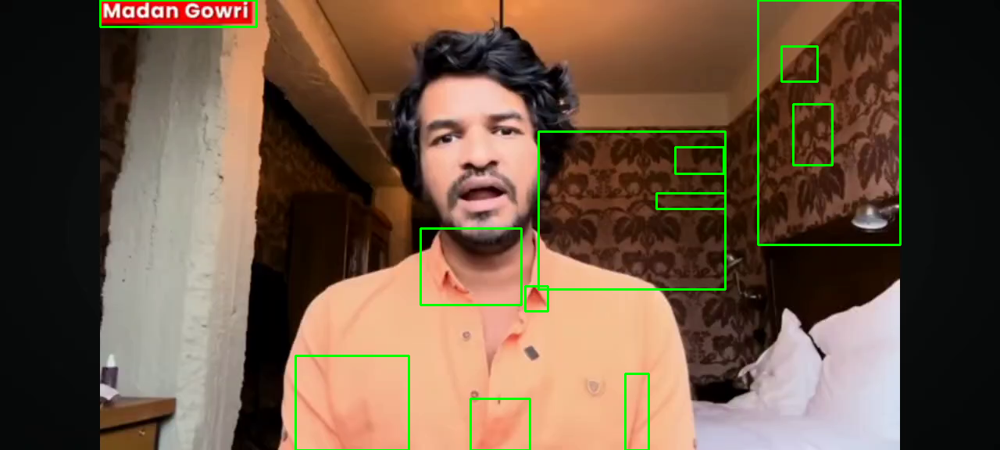

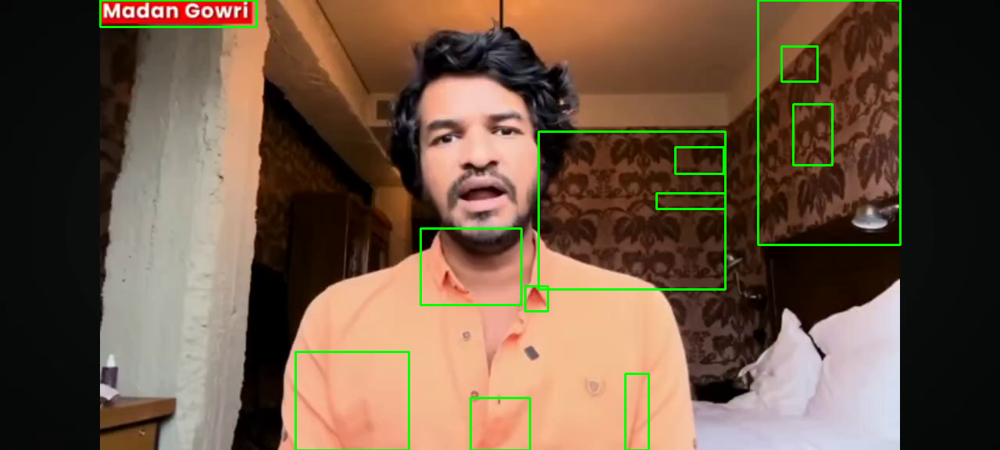

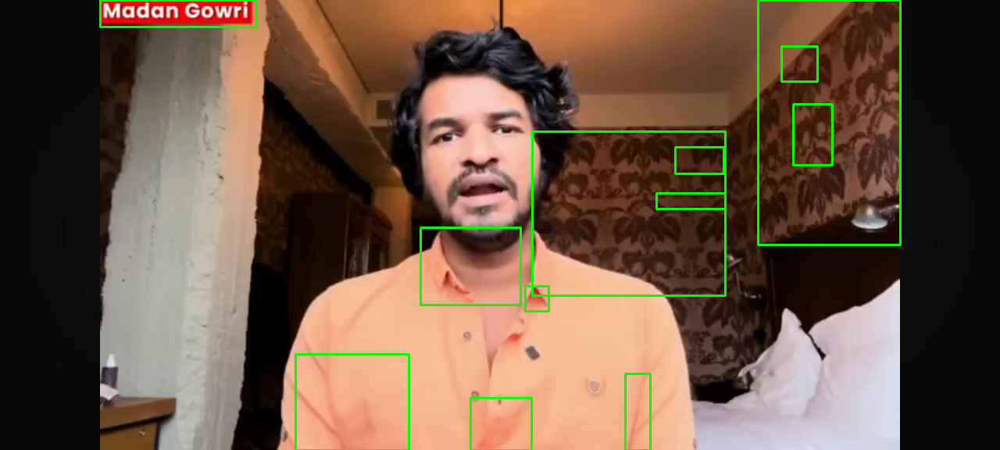

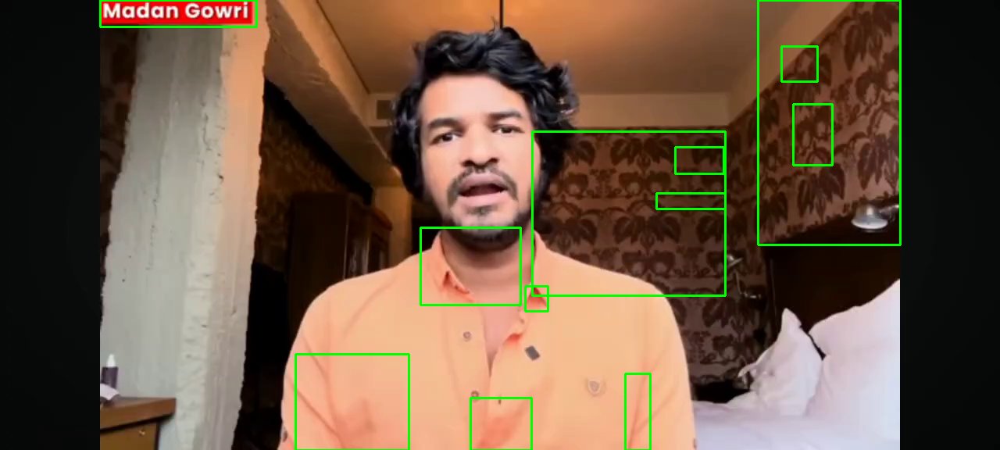

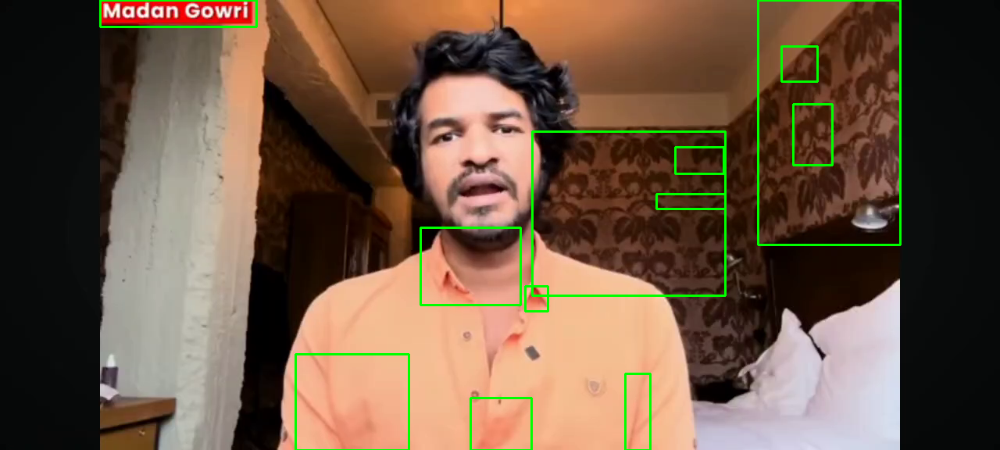

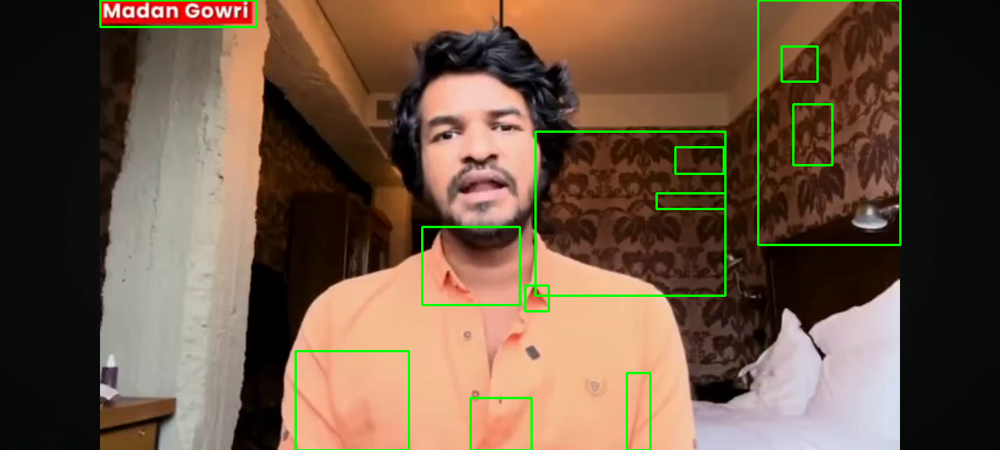

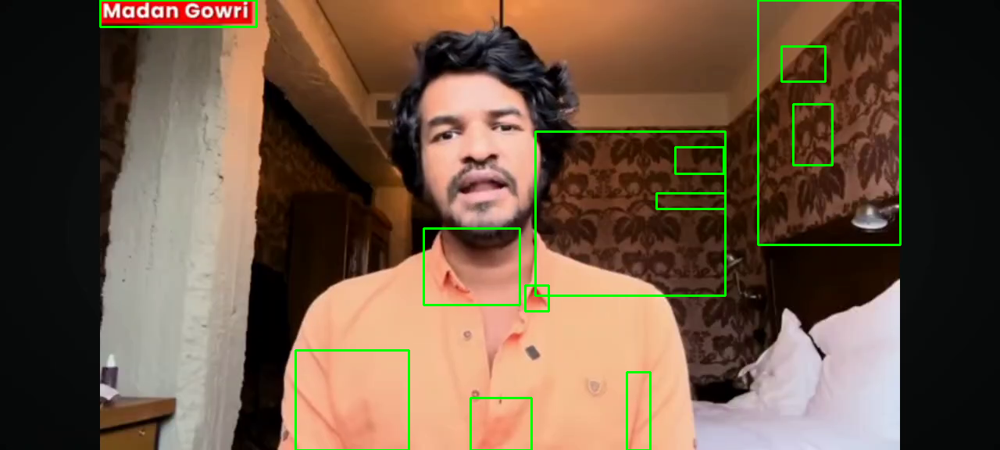

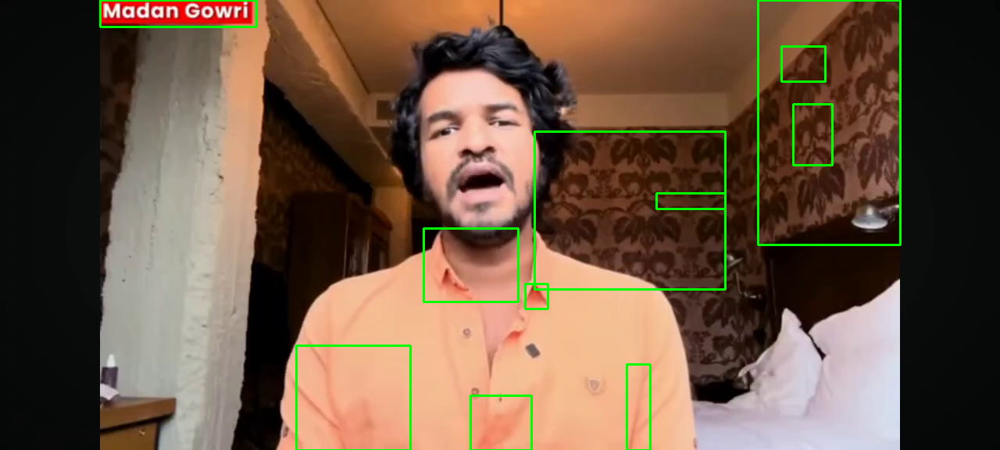

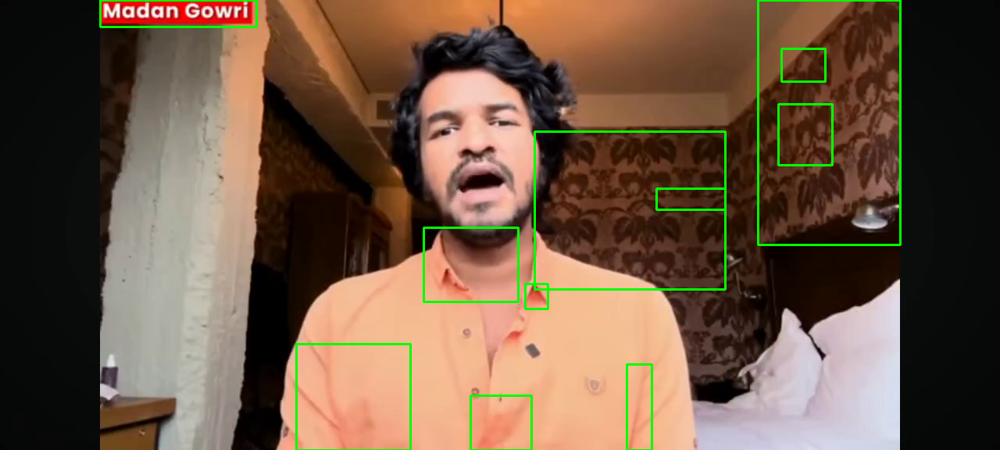

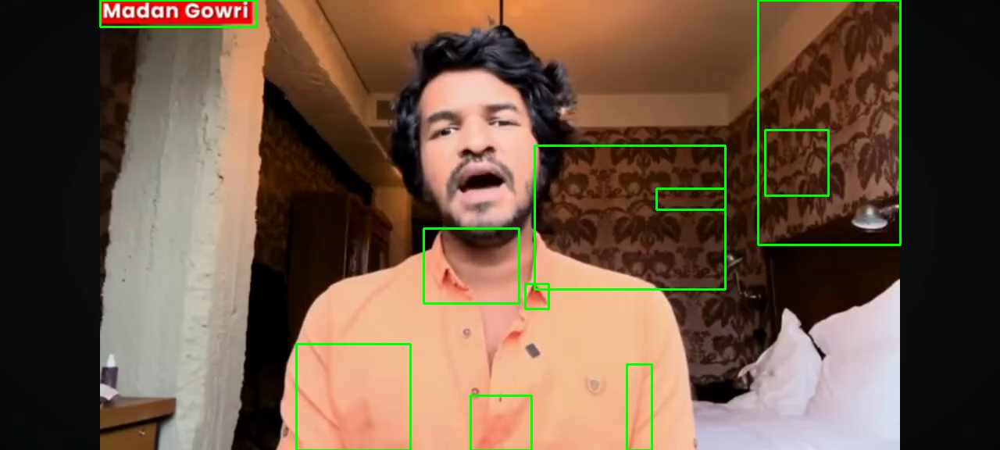

In [3]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

cap = cv2.VideoCapture('/content/vidd.mp4')  # Change to your uploaded video name

for _ in range(10):  # Show 10 frames
    ret, frame = cap.read()
    if not ret:
        break
    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)

    # Red color ranges
    lower_red1 = np.array([0, 120, 70])
    upper_red1 = np.array([10, 255, 255])
    lower_red2 = np.array([170, 120, 70])
    upper_red2 = np.array([180, 255, 255])

    mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
    mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
    mask = mask1 + mask2

    # Draw rectangles
    contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    for cnt in contours:
        if cv2.contourArea(cnt) > 500:
            x, y, w, h = cv2.boundingRect(cnt)
            cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)

    cv2_imshow(frame)

cap.release()

9

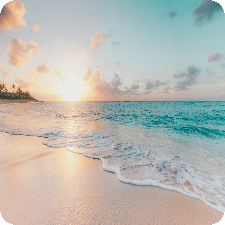

In [4]:
fg = cv2.imread('/content/green.png')
bg = cv2.imread('/content/beach.jpeg')
bg = cv2.resize(bg, (fg.shape[1], fg.shape[0]))

hsv = cv2.cvtColor(fg, cv2.COLOR_BGR2HSV)
lower_green = np.array([36, 25, 25])
upper_green = np.array([86, 255, 255])
mask = cv2.inRange(hsv, lower_green, upper_green)

mask_inv = cv2.bitwise_not(mask)
fg_no_bg = cv2.bitwise_and(fg, fg, mask=mask_inv)
bg_only = cv2.bitwise_and(bg, bg, mask=mask)

final = cv2.add(fg_no_bg, bg_only)
cv2_imshow(final)


10

Total Frames: 288


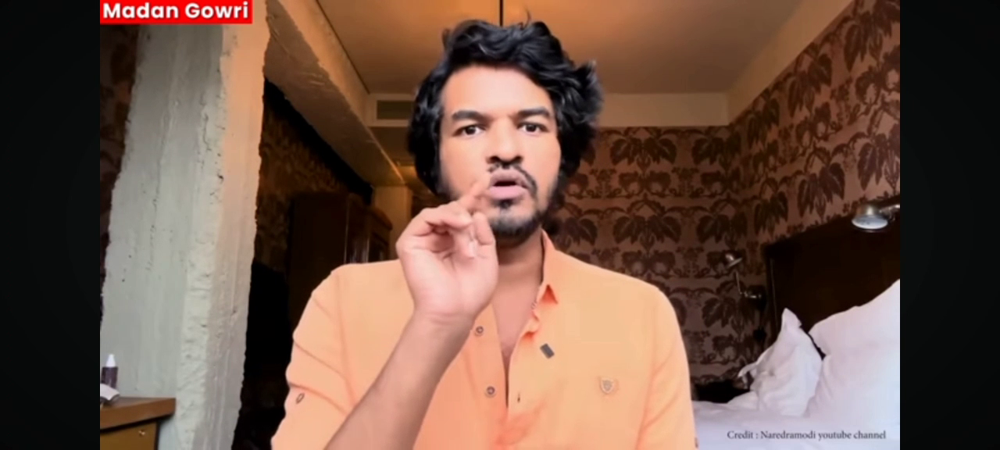

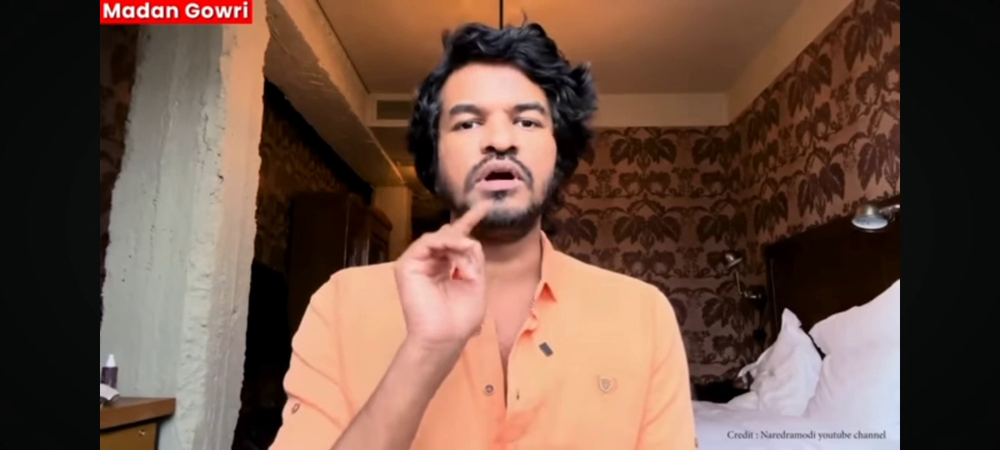

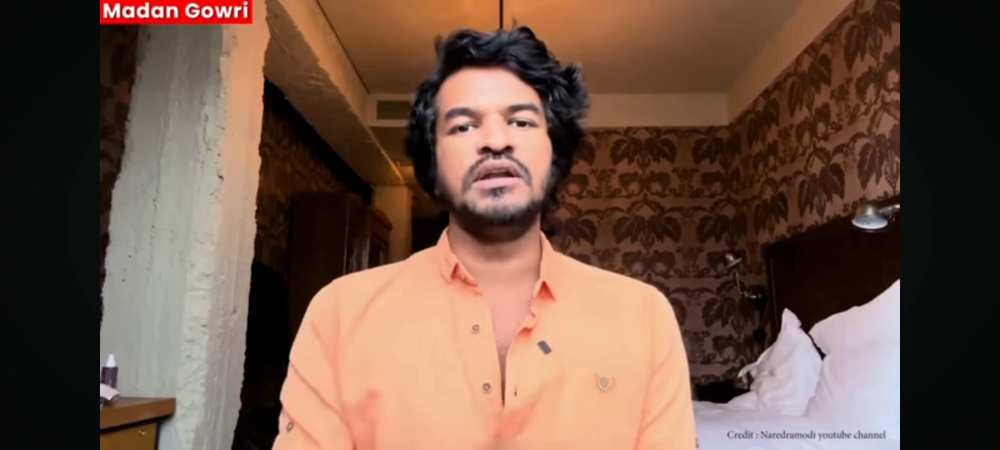

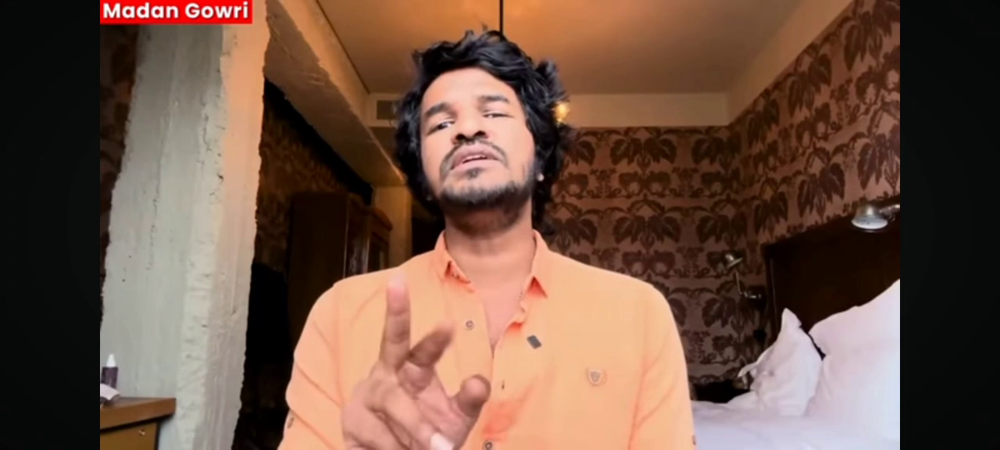

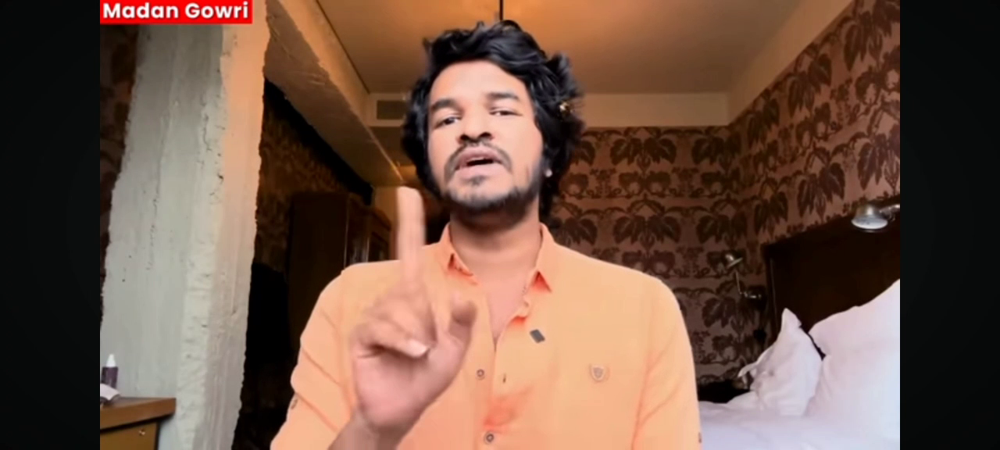

In [5]:
video = cv2.VideoCapture('/content/vidd.mp4')  # Upload your video first
total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
print("Total Frames:", total_frames)

import random
for i in random.sample(range(total_frames), 5):
    video.set(cv2.CAP_PROP_POS_FRAMES, i)
    ret, frame = video.read()
    if ret:
        cv2_imshow(frame)

video.release()
